# Prepare a model for glass classification using KNN

Data Description:
RI : refractive index
Na: Sodium (unit measurement: weight percent in corresponding oxide, as are attributes 4-10)
Mg: Magnesium
AI: Aluminum
Si: Silicon
K:Potassium
Ca: Calcium
Ba: Barium
Fe: Iron

Type: Type of glass: (class attribute)
 1 -- building_windows_float_processed
 2 --building_windows_non_float_processed
 3 --vehicle_windows_float_processed
 4 --vehicle_windows_non_float_processed (none in this database)
 5 --containers
 6 --tableware
 7 --headlamps

# Importing Necessary Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as pe
import statsmodels.api as sm
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report

import warnings

warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (15,8)
plt.rcParams['figure.dpi'] = 250
sns.set_style(style='darkgrid')
plt.tight_layout()
%matplotlib inline

In [2]:
gs = pd.read_csv(r"C:\Users\DELL\OneDrive\Desktop\assignment\13\glass.csv")
gs

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
0,1.52101,13.64,4.49,1.10,71.78,0.06,8.75,0.00,0.0,1
1,1.51761,13.89,3.60,1.36,72.73,0.48,7.83,0.00,0.0,1
2,1.51618,13.53,3.55,1.54,72.99,0.39,7.78,0.00,0.0,1
3,1.51766,13.21,3.69,1.29,72.61,0.57,8.22,0.00,0.0,1
4,1.51742,13.27,3.62,1.24,73.08,0.55,8.07,0.00,0.0,1
...,...,...,...,...,...,...,...,...,...,...
209,1.51623,14.14,0.00,2.88,72.61,0.08,9.18,1.06,0.0,7
210,1.51685,14.92,0.00,1.99,73.06,0.00,8.40,1.59,0.0,7
211,1.52065,14.36,0.00,2.02,73.42,0.00,8.44,1.64,0.0,7
212,1.51651,14.38,0.00,1.94,73.61,0.00,8.48,1.57,0.0,7


In [3]:
gs_nrow = gs.shape[0]

In [4]:
def lost_record():

    gs_nrow_now = gs.shape[0]
    lost = gs_nrow - gs_nrow_now
    lost = (lost/gs_nrow)*100
    lost = round(lost, 2)

    return print('We lost ' + str(lost) + ' % data')

# Performing EDA In Dataset

In [5]:
gs['Type'].value_counts()

2    76
1    70
7    29
3    17
5    13
6     9
Name: Type, dtype: int64

In [6]:
gs.describe()

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
count,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000,214.000000
mean,1.518365,13.407850,2.684533,1.444907,72.650935,0.497056,8.956963,0.175047,0.057009,2.780374
std,0.003037,0.816604,1.442408,0.499270,0.774546,0.652192,1.423153,0.497219,0.097439,2.103739
min,1.511150,10.730000,0.000000,0.290000,69.810000,0.000000,5.430000,0.000000,0.000000,1.000000
25%,1.516522,12.907500,2.115000,1.190000,72.280000,0.122500,8.240000,0.000000,0.000000,1.000000
50%,1.517680,13.300000,3.480000,1.360000,72.790000,0.555000,8.600000,0.000000,0.000000,2.000000
75%,1.519157,13.825000,3.600000,1.630000,73.087500,0.610000,9.172500,0.000000,0.100000,3.000000
max,1.533930,17.380000,4.490000,3.500000,75.410000,6.210000,16.190000,3.150000,0.510000,7.000000


In [7]:
gs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 214 entries, 0 to 213
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   RI      214 non-null    float64
 1   Na      214 non-null    float64
 2   Mg      214 non-null    float64
 3   Al      214 non-null    float64
 4   Si      214 non-null    float64
 5   K       214 non-null    float64
 6   Ca      214 non-null    float64
 7   Ba      214 non-null    float64
 8   Fe      214 non-null    float64
 9   Type    214 non-null    int64  
dtypes: float64(9), int64(1)
memory usage: 16.8 KB


In [8]:
gs[gs.duplicated()].shape

(1, 10)

In [9]:
gs[gs.duplicated()]

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
39,1.52213,14.21,3.82,0.47,71.77,0.11,9.57,0.0,0.0,1


In [10]:
gl = gs.drop_duplicates()
gl

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
0,1.52101,13.64,4.49,1.10,71.78,0.06,8.75,0.00,0.0,1
1,1.51761,13.89,3.60,1.36,72.73,0.48,7.83,0.00,0.0,1
2,1.51618,13.53,3.55,1.54,72.99,0.39,7.78,0.00,0.0,1
3,1.51766,13.21,3.69,1.29,72.61,0.57,8.22,0.00,0.0,1
4,1.51742,13.27,3.62,1.24,73.08,0.55,8.07,0.00,0.0,1
...,...,...,...,...,...,...,...,...,...,...
209,1.51623,14.14,0.00,2.88,72.61,0.08,9.18,1.06,0.0,7
210,1.51685,14.92,0.00,1.99,73.06,0.00,8.40,1.59,0.0,7
211,1.52065,14.36,0.00,2.02,73.42,0.00,8.44,1.64,0.0,7
212,1.51651,14.38,0.00,1.94,73.61,0.00,8.48,1.57,0.0,7


In [11]:
gs.isna().sum()

RI      0
Na      0
Mg      0
Al      0
Si      0
K       0
Ca      0
Ba      0
Fe      0
Type    0
dtype: int64

In [12]:
def uni(dff):

    for i in range(len(dff.columns)):
        print('\n All Unique Value in ' + str(dff.columns[i]))
        print(np.sort(dff[dff.columns[i]].unique()))
        print('Total no of unique values ' +
              str(len(dff[dff.columns[i]].unique())))

In [13]:
uni(gs)


 All Unique Value in RI
[1.51115 1.51131 1.51215 1.51299 1.51316 1.51321 1.51409 1.51508 1.51514
 1.51531 1.51545 1.51556 1.51567 1.51569 1.51571 1.51574 1.51588 1.51589
 1.5159  1.51592 1.51593 1.51594 1.51596 1.51602 1.51605 1.51609 1.5161
 1.51613 1.51617 1.51618 1.51623 1.51625 1.51627 1.51629 1.51631 1.5164
 1.51643 1.51645 1.51646 1.51651 1.51652 1.51653 1.51655 1.51658 1.5166
 1.51662 1.51663 1.51665 1.51666 1.51667 1.5167  1.51673 1.51674 1.51683
 1.51685 1.51687 1.51689 1.5169  1.51694 1.51707 1.51708 1.51709 1.51711
 1.51719 1.5172  1.51721 1.51727 1.5173  1.51732 1.51735 1.51736 1.51742
 1.51743 1.51747 1.51748 1.5175  1.51751 1.51753 1.51754 1.51755 1.51756
 1.51761 1.51763 1.51764 1.51766 1.51768 1.51769 1.51775 1.51776 1.51778
 1.51779 1.51783 1.51784 1.51786 1.51789 1.51793 1.51796 1.51797 1.518
 1.51806 1.51808 1.51811 1.51813 1.51818 1.5182  1.51824 1.51829 1.51831
 1.51832 1.51837 1.51838 1.51839 1.51841 1.51844 1.51846 1.51847 1.51848
 1.51851 1.51852 1.5186  1.5186

# Correlation Analysis

In [14]:
gf=gl.corr()
gf

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
RI,1.000000,-0.198802,-0.127526,-0.400973,-0.539000,-0.287645,0.811183,0.001679,0.147083,-0.160140
Na,-0.198802,1.000000,-0.278420,0.167735,-0.064885,-0.264158,-0.278194,0.329080,-0.239374,0.508837
Mg,-0.127526,-0.278420,1.000000,-0.479575,-0.162437,0.007617,-0.446197,-0.491818,0.085426,-0.744195
Al,-0.400973,0.167735,-0.479575,1.000000,-0.016195,0.323683,-0.258068,0.480642,-0.080583,0.597432
Si,-0.539000,-0.064885,-0.162437,-0.016195,1.000000,-0.197281,-0.207145,-0.104389,-0.097717,0.147725
K,-0.287645,-0.264158,0.007617,0.323683,-0.197281,1.000000,-0.317032,-0.043653,-0.009372,-0.012455
Ca,0.811183,-0.278194,-0.446197,-0.258068,-0.207145,-0.317032,1.000000,-0.112208,0.126314,0.002677
Ba,0.001679,0.329080,-0.491818,0.480642,-0.104389,-0.043653,-0.112208,1.000000,-0.059729,0.574896
Fe,0.147083,-0.239374,0.085426,-0.080583,-0.097717,-0.009372,0.126314,-0.059729,1.000000,-0.191090
Type,-0.160140,0.508837,-0.744195,0.597432,0.147725,-0.012455,0.002677,0.574896,-0.191090,1.000000


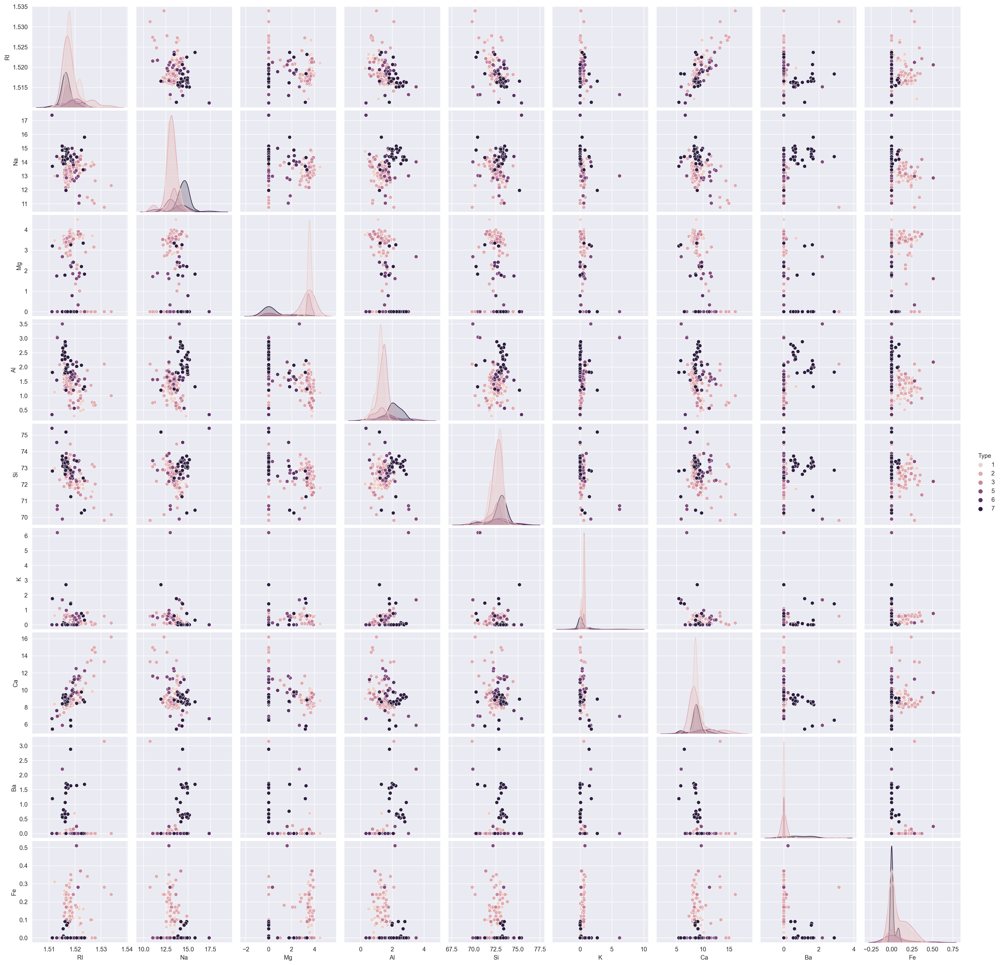

In [15]:
#pairwise plot of all the features
sns.pairplot(gl,hue='Type')
plt.show()

In [16]:
##The pairplot shows that the data is not linear and KNN can be applied to get nearest neighbors and classify the glass types

<AxesSubplot:>

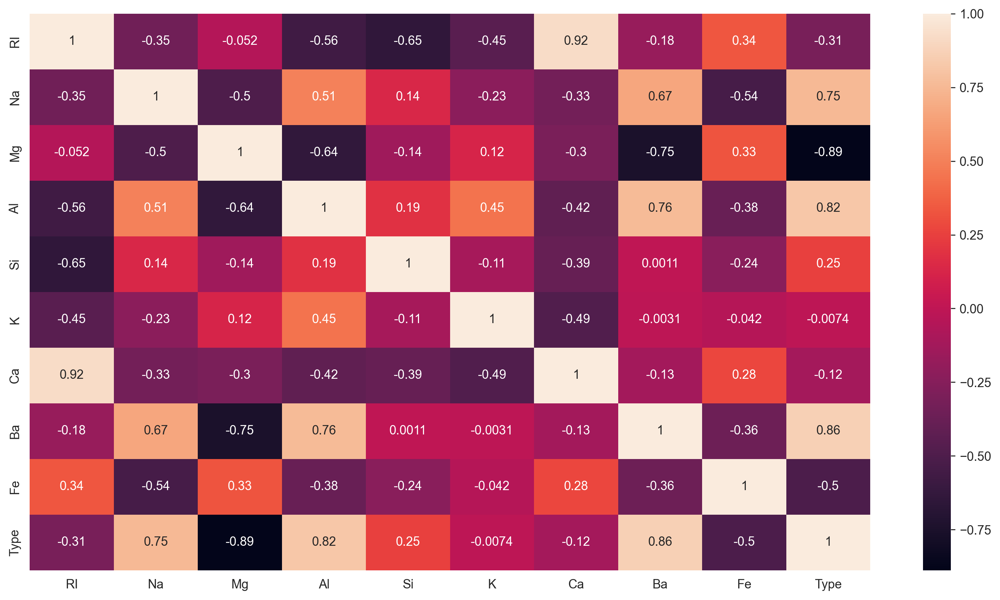

In [17]:
sns.heatmap(gf.corr(), annot=True)

# Scatter plot of two features

<AxesSubplot:xlabel='RI', ylabel='Na'>

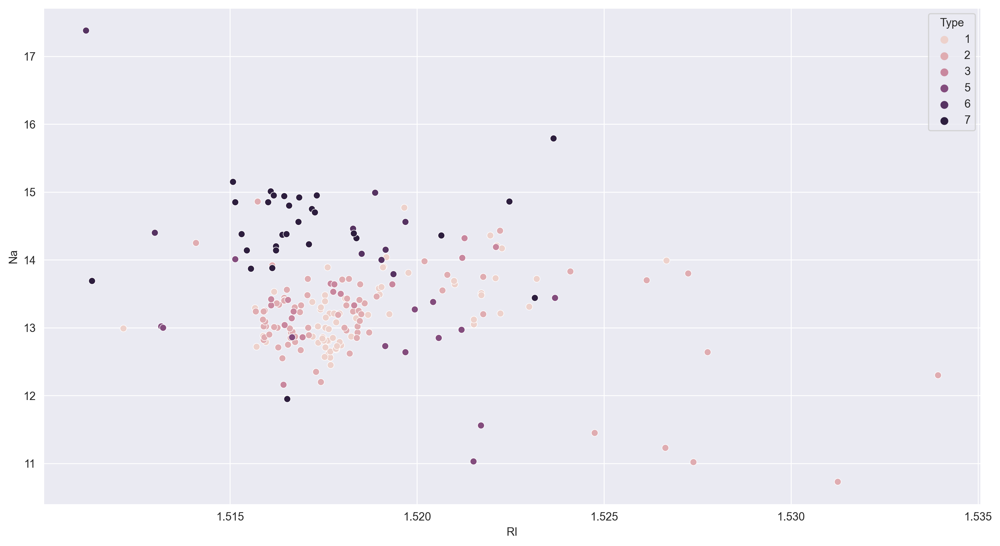

In [18]:
sns.scatterplot(gl['RI'],gl['Na'],hue=gl['Type'])

In [19]:
# Suppose we consider only RI, and Na values for classification for glass type.

#From the above plot, We first calculate the nearest neighbors from the new data point to be calculated.
#If the majority of nearest neighbors belong to a particular class, say type 4, then we classify the data point as type 4.
#But there are a lot more than two features based on which we can classify. So let us take a look at pairwise plot to capture all the features.

# Visualizing The Data

In [20]:
# Ploting Boxplot
def plot_box(dff,r,c):
    r = int(r)
    c = int(c)
    fig,ax = plt.subplots(r,c)
    plt.tight_layout()

    for i in range(r):
        for j in range(c):
            sns.boxplot(dff[dff.columns[i+j]], ax = ax[i,j],palette='hsv')

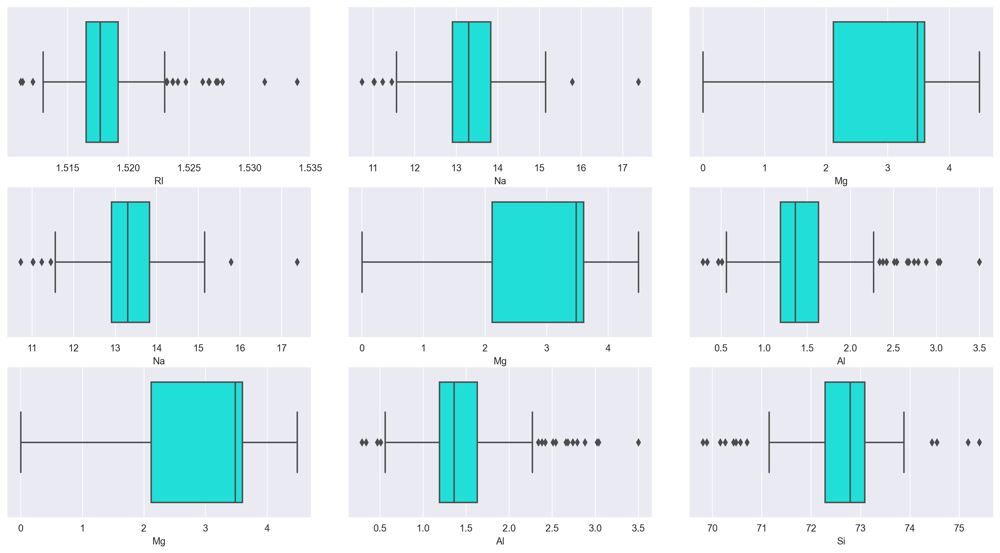

In [21]:
plot_box(gs,3,3)

In [22]:
def plot_hist(dff,r,c):
    r = int(r)
    c = int(c)
    fig,ax = plt.subplots(r,c)
    plt.tight_layout()

    for i in range(r):
        for j in range(c):
            sns.histplot(dff[dff.columns[i+j]], ax = ax[i,j])

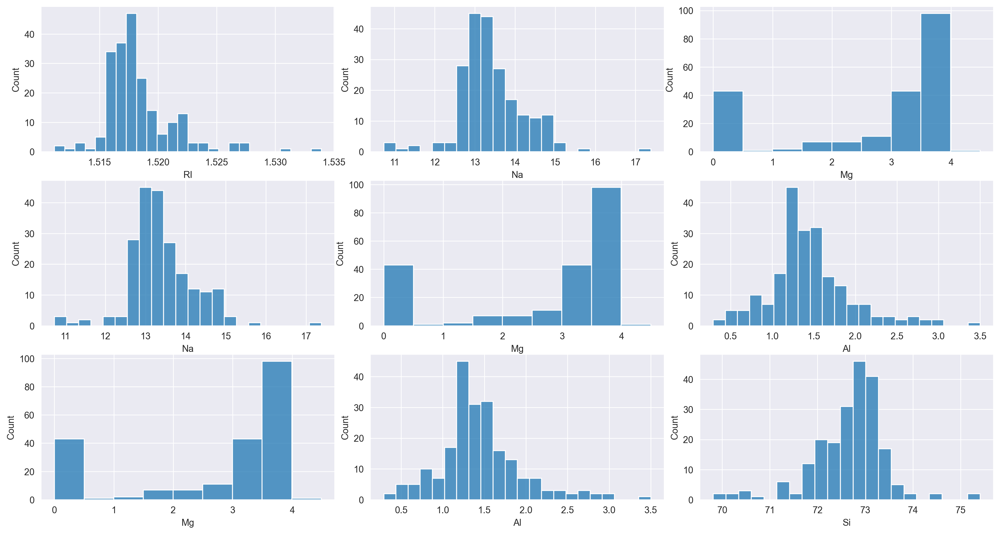

In [23]:
plot_hist(gl,3,3)

# Ploting QQ-Plot

In [24]:
def plot_qq(dff,r,c):
    r = int(r)
    c = int(c)
    fig,ax = plt.subplots(r,c)
    plt.tight_layout()

    for i in range(r):
        for j in range(c):
            sm.qqplot(dff[dff.columns[i+j]], ax = ax[i,j], line='q')

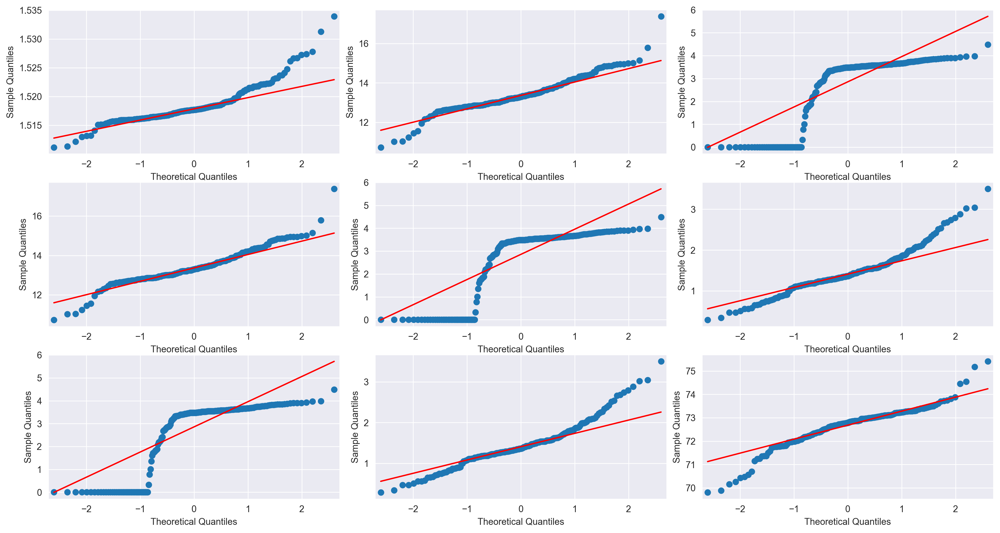

In [25]:
plot_qq(gs,3,3)

#  Outlier Detection

In [26]:
def outlier_percentage(dff):
    for i in range(len(dff.columns)):

        q1 = dff[dff.columns[i]].quantile(0.25)
        q3 = dff[dff.columns[i]].quantile(0.75)
        iqr = q3-q1

        upper = q3 + (iqr*1.5)
        lower = q1 - (iqr*1.5)

        percentage = (((len(dff[dff[dff.columns[i]] > upper])) +
                      (len(dff[dff[dff.columns[i]] < lower])))/len(dff[dff.columns[i]]))*100

        print(str(dff.columns[i]) + ' : ' + str(percentage) + ' %')

In [27]:
def replace_outlier_extream(st, col):

    q1 = st[col].quantile(0.25)
    q3 = st[col].quantile(0.75)
    iqr = q3-q1

    upper = q3 + (iqr*1.5)
    lower = q1 - (iqr*1.5)

    st[col].mask(st[col] > upper, upper, inplace=True)
    st[col].mask(st[col] < lower, lower, inplace=True)

In [28]:
def remove_outlier(st, col):
    q1 = st[col].quantile(0.25)
    q3 = st[col].quantile(0.75)
    iqr = q3-q1

    upper = q3 + (iqr*1.5)
    lower = q1 - (iqr*1.5)

    st = st[(st[col] > lower) & (st[col] < upper)]

    return st

In [29]:
# Outlier Percentage(Before)
outlier_percentage(gl)

RI : 7.981220657276995 %
Na : 3.286384976525822 %
Mg : 0.0 %
Al : 7.981220657276995 %
Si : 5.633802816901409 %
K : 3.286384976525822 %
Ca : 12.676056338028168 %
Ba : 17.84037558685446 %
Fe : 5.633802816901409 %
Type : 13.615023474178404 %


# Replacing Outlier In RI Column

In [30]:
pe.box(gl['RI'], orientation='h')

replace_outlier_extream(gl, 'RI')

pe.box(gl['RI'], orientation='h')

In [33]:
# Removing Outlier In Na Column
pe.box(gl['Na'], orientation='h')

gl = remove_outlier(gl, 'Na')

pe.box(gl['Na'], orientation='h')


In [34]:
lost_record()

We lost 3.27 % data


In [35]:
# Replacing Outlier In Mg Column

pe.box(gl['Mg'], orientation='h')

replace_outlier_extream(gl, 'Mg')

pe.box(gl['Mg'], orientation='h')

In [36]:
# Removing Outlier In Si Column

pe.box(gl['Si'], orientation='h')

gl = remove_outlier(gl, 'Si')

pe.box(gl['Si'], orientation='h')

In [37]:
lost_record()

We lost 3.27 % data


In [38]:
# Removing Outlier In K Column

pe.box(gl['K'], orientation='h')

gl = remove_outlier(gl, 'K')

pe.box(gl['K'], orientation='h')


In [39]:
lost_record()

We lost 3.27 % data


In [40]:
# Replacing Outlier In Ca(Calcium) Column

pe.box(gl['Ca'], orientation='h')

replace_outlier_extream(gl, 'Ca')

pe.box(gl['Ca'], orientation='h')

In [41]:
# Outlier Percentage(After)
outlier_percentage(gl)

RI : 4.145077720207254 %
Na : 2.072538860103627 %
Mg : 18.65284974093264 %
Al : 7.253886010362693 %
Si : 0.5181347150259068 %
K : 0.0 %
Ca : 0.0 %
Ba : 16.580310880829018 %
Fe : 5.181347150259067 %
Type : 11.917098445595855 %


#all value in are unique value, so well retain Outlier in Ba and Fe.

#we will retain outlier in Type becaue it is dependent column.

In [42]:
# Reseting Index

gl.reset_index(inplace=True)

gl.drop(columns='index', inplace=True)
gl

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe,Type
0,1.52101,13.64,4.49000,1.10,71.78,0.06,8.75,0.00,0.0,1
1,1.51761,13.89,3.60000,1.36,72.73,0.48,7.83,0.00,0.0,1
2,1.51618,13.53,3.55000,1.54,72.99,0.39,7.78,0.00,0.0,1
3,1.51766,13.21,3.69000,1.29,72.61,0.57,8.22,0.00,0.0,1
4,1.51742,13.27,3.62000,1.24,73.08,0.55,8.07,0.00,0.0,1
...,...,...,...,...,...,...,...,...,...,...
188,1.51623,14.14,0.57625,2.88,72.61,0.08,9.18,1.06,0.0,7
189,1.51685,14.92,0.57625,1.99,73.06,0.00,8.40,1.59,0.0,7
190,1.52065,14.36,0.57625,2.02,73.42,0.00,8.44,1.64,0.0,7
191,1.51651,14.38,0.57625,1.94,73.61,0.00,8.48,1.57,0.0,7


# Splitting The Data Into Target and Independent set

In [43]:
x = gl.iloc[:,:-1]

y = gl['Type']

In [44]:
x

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe
0,1.52101,13.64,4.49000,1.10,71.78,0.06,8.75,0.00,0.0
1,1.51761,13.89,3.60000,1.36,72.73,0.48,7.83,0.00,0.0
2,1.51618,13.53,3.55000,1.54,72.99,0.39,7.78,0.00,0.0
3,1.51766,13.21,3.69000,1.29,72.61,0.57,8.22,0.00,0.0
4,1.51742,13.27,3.62000,1.24,73.08,0.55,8.07,0.00,0.0
...,...,...,...,...,...,...,...,...,...
188,1.51623,14.14,0.57625,2.88,72.61,0.08,9.18,1.06,0.0
189,1.51685,14.92,0.57625,1.99,73.06,0.00,8.40,1.59,0.0
190,1.52065,14.36,0.57625,2.02,73.42,0.00,8.44,1.64,0.0
191,1.51651,14.38,0.57625,1.94,73.61,0.00,8.48,1.57,0.0


# Normalizing The Dataset

In [45]:
sc = StandardScaler()
scaled_x  = pd.DataFrame(sc.fit_transform(x), columns=x.columns)
scaled_x

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe
0,1.445600,0.341851,1.340582,-0.758439,-1.757861,-1.420997,-0.016104,-0.348468,-0.608429
1,-0.219243,0.722167,0.574185,-0.165073,0.031622,0.226165,-1.346062,-0.348468,-0.608429
2,-0.919456,0.174512,0.531129,0.245718,0.521375,-0.126799,-1.418342,-0.348468,-0.608429
3,-0.194760,-0.312293,0.651685,-0.324826,-0.194418,0.579128,-0.782275,-0.348468,-0.608429
4,-0.312279,-0.221017,0.591407,-0.438935,0.690905,0.500692,-0.999116,-0.348468,-0.608429
...,...,...,...,...,...,...,...,...,...
188,-0.894974,1.102483,-2.029629,3.303834,-0.194418,-1.342561,0.605507,2.534246,-0.608429
189,-0.591385,2.289068,-2.029629,1.272697,0.653232,-1.656306,-0.522066,3.975603,-0.608429
190,1.269322,1.437161,-2.029629,1.341163,1.331352,-1.656306,-0.464242,4.111580,-0.608429
191,-0.757869,1.467586,-2.029629,1.158589,1.689248,-1.656306,-0.406418,3.921212,-0.608429


# Splitting The Data Into Training And Testing Set

In [46]:
xtrain,xtest,ytrain,ytest = train_test_split(scaled_x,y,train_size=0.75,random_state=1)

xtrain

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe
112,-0.699110,-0.738246,0.522517,0.428292,0.464865,0.853655,-1.056940,-0.348468,1.566142
42,1.979329,0.478764,0.780854,-1.625666,-1.795534,-0.989598,1.415046,-0.348468,-0.608429
17,1.910776,1.437161,0.789465,-1.237696,-2.549000,-1.068034,0.562139,-0.348468,-0.608429
5,-1.027182,-0.951223,0.582796,0.428292,0.483702,0.853655,-0.999116,-0.348468,2.083897
116,0.324279,-0.738246,0.625852,0.291362,-0.382784,0.618346,-0.305225,-0.348468,0.634183
...,...,...,...,...,...,...,...,...,...
133,-0.704006,-0.859947,0.496684,0.017501,0.559049,1.010528,-0.767819,-0.185295,1.980346
137,-0.180070,0.357063,0.625852,-0.735617,0.106969,-1.224907,-0.232945,-0.348468,-0.608429
72,-0.855801,-0.114528,0.548351,0.314183,0.295335,0.736001,-1.259325,-0.348468,-0.608429
140,-0.797042,-1.909619,0.505295,-0.187895,0.333009,0.579128,-0.334137,-0.348468,-0.608429


# Preparing Model From The Dataset

# Creating KNN Model With Default Value

In [47]:
model_def = KNeighborsClassifier()
model_def.fit(xtrain,ytrain)
ypred = model_def.predict(xtest)

In [48]:
#Evaluating The Model 

#Creating Classification Report

print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

           1       0.77      0.85      0.81        20
           2       0.60      0.69      0.64        13
           3       0.00      0.00      0.00         3
           5       1.00      0.33      0.50         3
           6       1.00      1.00      1.00         2
           7       1.00      1.00      1.00         8

    accuracy                           0.76        49
   macro avg       0.73      0.65      0.66        49
weighted avg       0.74      0.76      0.74        49



In [49]:
#Comparing Training And Testing Accuracy

print('Training Accuracy of are Model is : ' + str(model_def.score(xtrain,ytrain)))

print('Testing Accuracy of are Model is : ' + str(model_def.score(xtest, ytest)))


Training Accuracy of are Model is : 0.7777777777777778
Testing Accuracy of are Model is : 0.7551020408163265


# Performing Hyperparameter Tuning

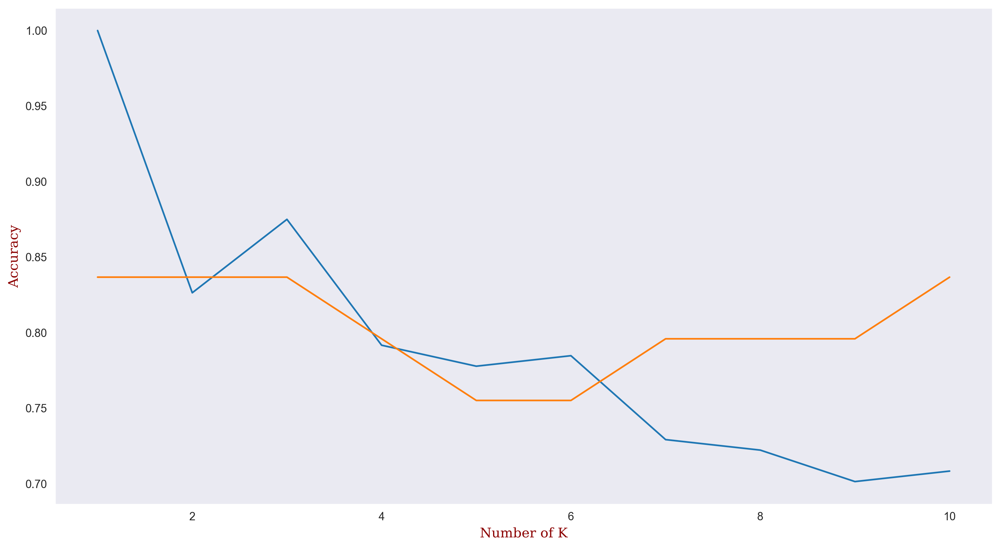

In [53]:
trainac = []
testac = []
font2 = {'family':'serif','color':'darkred','size':12}

for i in range(1,11):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(xtrain,ytrain)
    ypred = knn.predict(xtest)
    
    trainac.append(knn.score(xtrain,ytrain))
    testac.append(knn.score(xtest,ytest))

plt.title('')
plt.plot(range(1,11),trainac)
plt.plot(range(1,11), testac)
plt.xlabel('Number of K',fontdict= font2)
plt.ylabel('Accuracy',fontdict= font2)
plt.grid()

# Creating Final Model With Hyperparameter Value

In [54]:
model_final = KNeighborsClassifier(n_neighbors = 2)
model_final.fit(xtrain,ytrain)
ypred = model_final.predict(xtest)

In [55]:
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

           1       0.82      0.90      0.86        20
           2       0.79      0.85      0.81        13
           3       0.50      0.33      0.40         3
           5       1.00      0.33      0.50         3
           6       1.00      1.00      1.00         2
           7       1.00      1.00      1.00         8

    accuracy                           0.84        49
   macro avg       0.85      0.74      0.76        49
weighted avg       0.84      0.84      0.83        49



In [56]:
# Comparing Training And Testing Accuracy
print('Training Accuracy of are Model is : ' + str(model_final.score(xtrain,ytrain)))

print('Testing Accuracy of are Model is : ' + str(model_final.score(xtest, ytest)))


Training Accuracy of are Model is : 0.8263888888888888
Testing Accuracy of are Model is : 0.8367346938775511


In [29]:
x_train,x_test,y_train,y_test= train_test_split(x,y, test_size=0.3,random_state=45)

In [30]:
x_train

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe
185,0.010659,1.124177,0.403249,1.557355,-1.819617,1.474913,-2.224265,2.925383,-0.588301
202,-0.584217,1.713320,-1.860172,1.092483,0.589150,-0.765554,-0.473863,3.086325,-0.588301
210,0.760865,1.173272,-1.860172,1.153118,0.990612,-0.765554,-0.361387,2.945501,-0.588301
72,-0.673449,-0.078656,0.618482,0.243586,0.278342,0.170531,-0.748022,-0.353808,-0.588301
58,-0.266950,-0.017287,0.680969,-0.524464,0.174739,0.109149,-0.480893,-0.353808,0.541526
...,...,...,...,...,...,...,...,...,...
32,-0.197547,-0.680073,0.555995,-0.443617,0.407845,0.170531,-0.277031,-0.172748,1.671354
124,0.123025,-0.581882,0.680969,0.223374,-0.187871,0.124494,-0.284060,-0.353808,0.644238
131,-0.071962,0.031808,0.903145,-0.544676,-0.213772,0.124494,-0.565249,-0.353808,-0.588301
158,-0.128145,0.117725,0.472679,0.364857,-0.926042,0.109149,-0.101287,-0.353808,0.336103


In [31]:
x_test

,RI,Na,Mg,Al,Si,K,Ca,Ba,Fe
83,-1.407130,1.038260,0.285217,1.274389,-0.485730,0.922469,-1.317430,-0.353808,-0.588301
62,1.296254,0.940070,0.785114,-1.353149,-1.690113,-0.765554,0.517328,-0.353808,-0.588301
84,-0.693278,-0.054108,0.625425,0.081891,0.084086,-0.074999,-0.523071,-0.353808,-0.588301
137,-0.531339,-0.753716,0.583767,0.182950,0.912909,0.247260,-0.740993,-0.353808,-0.588301
187,1.362351,1.786963,-0.332710,1.233966,-3.101703,0.400716,0.566537,-0.353808,-0.588301
...,...,...,...,...,...,...,...,...,...
115,-0.019084,-0.201394,0.847601,-0.079804,-0.420978,0.078457,-0.452774,-0.353808,0.438815
4,-0.306608,-0.164573,0.653197,-0.423405,0.550299,0.078457,-0.621487,-0.353808,-0.588301
28,-0.220682,-1.036013,0.583767,-0.039380,0.640952,0.109149,-0.291090,-0.353808,-0.588301
113,0.040403,-0.373227,0.896202,-0.524464,-0.278524,0.155186,-0.368417,-0.353808,-0.588301


In [32]:
y_test

84     2
63     1
85     2
138    2
188    7
      ..
116    2
4      1
28     1
114    2
126    2
Name: Type, Length: 64, dtype: int64

In [33]:
y_train

186    7
203    7
211    7
73     2
59     1
      ..
32     1
125    2
132    2
159    3
204    7
Name: Type, Length: 149, dtype: int64

KNN Model

In [34]:
model = KNeighborsClassifier(n_neighbors=3)
model.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=3)

In [35]:
#Predicting on test data
preds = model.predict(x_test) # predicting on test data set 
pd.Series(preds).value_counts() # getting the count of each category

1    29
2    23
7     7
3     3
5     2
dtype: int64

In [36]:
pd.crosstab(y_test,preds) # getting the 2 way table to understand the correct and wrong predictions

col_0,1,2,3,5,7
Type,,,,,
1,16,2,1,0,0
2,6,19,2,1,0
3,6,2,0,0,0
7,1,0,0,1,7


In [37]:
print("Accuracy", accuracy_score(y_test,preds)*100)

Accuracy 65.625


In [38]:
model.score(x_train,y_train)

0.825503355704698

In [39]:
print(classification_report(y_test,preds))

              precision    recall  f1-score   support

           1       0.55      0.84      0.67        19
           2       0.83      0.68      0.75        28
           3       0.00      0.00      0.00         8
           5       0.00      0.00      0.00         0
           7       1.00      0.78      0.88         9

    accuracy                           0.66        64
   macro avg       0.48      0.46      0.46        64
weighted avg       0.67      0.66      0.65        64



Grid Search for Algorithm Tuning

In [40]:
n_neighbors = np.array(range(1,15))
param_grid = dict(n_neighbors=n_neighbors)

In [41]:
model = KNeighborsClassifier()
grid = GridSearchCV(estimator=model, param_grid=param_grid)
grid.fit(x, y)

GridSearchCV(estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])})

In [42]:
print(grid.best_score_)
print(grid.best_params_)

0.6666666666666667
{'n_neighbors': 2}


Visualizing the CV results

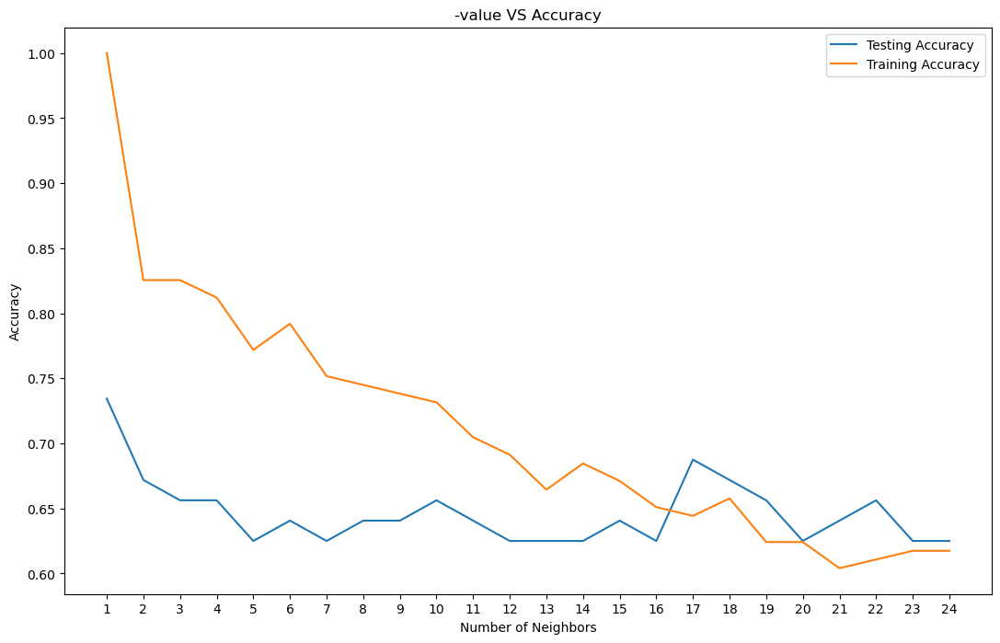

Best accuracy is 0.734375 with K = 1


In [43]:
k_values = np.arange(1,25)
train_accuracy = []
test_accuracy = []

for i, k in enumerate(k_values):
    # k from 1 to 25(exclude)
    knn = KNeighborsClassifier(n_neighbors=k)
    # Fit with knn
    knn.fit(x_train,y_train)
    #train accuracy
    train_accuracy.append(knn.score(x_train, y_train))
    # test accuracy
    test_accuracy.append(knn.score(x_test, y_test))
# Plot
plt.figure(figsize=[13,8])
plt.plot(k_values, test_accuracy, label = 'Testing Accuracy')
plt.plot(k_values, train_accuracy, label = 'Training Accuracy')
plt.legend()
plt.title('-value VS Accuracy')
plt.xlabel('Number of Neighbors')
plt.ylabel('Accuracy')
plt.xticks(k_values)
plt.savefig('graph.png')
plt.show()
print("Best accuracy is {} with K = {}".format(np.max(test_accuracy),1+test_accuracy.index(np.max(test_accuracy))))
